In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import skmob
import folium
from datetime import datetime
import dateutil.parser  
from folium.plugins import HeatMap
from matplotlib import pyplot as plt
from matplotlib import cm as mcm
from skmob.measures.individual import jump_lengths, radius_of_gyration, home_location

### Point of Interest Dataset - Analysis

In [2]:
col_names = ['vid', 'lat', 'lng', 'Type', 'Country']
dataPOIs = pd.read_csv('dataset_original/POIs.txt', sep='\t', header=None, names=col_names)
dataPOIs.head()

,vid,lat,lng,Type,Country
0,3fd66200f964a52000e71ee3,40.733596,-74.003139,Jazz Club,US
1,3fd66200f964a52000e81ee3,40.758102,-73.975734,Gym,US
2,3fd66200f964a52000ea1ee3,40.732456,-74.003755,Indian Restaurant,US
3,3fd66200f964a52000ec1ee3,42.345907,-71.087001,Indian Restaurant,US
4,3fd66200f964a52000ee1ee3,39.933178,-75.159262,Sandwich Place,US


In [3]:
dataPOIs.shape

(3680126, 5)

In the above table we can see that the POI (Point Of Interest) Dataset is composed by the following columns: `[VID, Latitude, Longitude, Type, Country]` and we have a total of `3.680.126` different Locations all around the world.
- `VID`: String identification code for a certain Point of Interest.
- `Latitude`: Floating point number for the latitude of the Point of Interest.
- `Longitude`: Floating point number for the longitude of the point of Interest.
- `Type`: String description for the type of Point of Interest
- `Country`: String description for the country of Point of Interest
    

/home/student2/miniconda3/envs/pytorch_env/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 26 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/student2/miniconda3/envs/pytorch_env/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:203: RuntimeWarning: Glyph 26 missing from current font.
  font.set_text(s, 0, flags=flags)


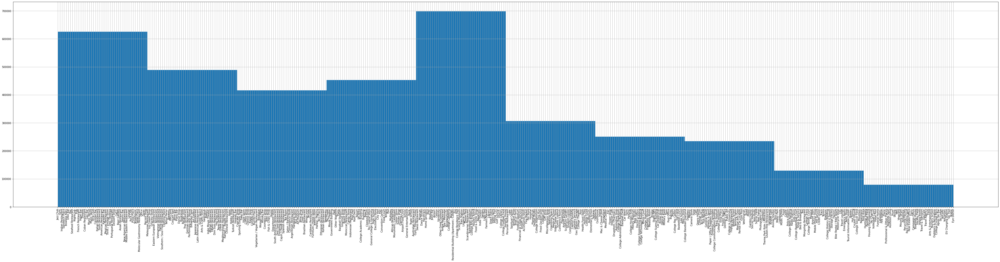

In [4]:
plt.figure(figsize=(70,15))
dataPOIs.Type.hist()
plt.xticks(rotation=90)
plt.show()

From the plot above we can see the distribution of the different types of POIs.\
In order to see which are the most common Types in the dataset we can do in the following way:

In [5]:
dataPOIs['Type'].value_counts()[:10].index.tolist()

['Home (private)',
 'Office',
 'Residential Building (Apartment / Condo)',
 'Building',
 'Caf\x1a\x1a',
 'Road',
 'Bank',
 'Restaurant',
 'Bar',
 'Salon / Barbershop']

The most frequent value is `home (private)`, This make us think about the fact that a lot of people decided to provide data regarding their personal home and in fact by mergin this dataset with the one with all the `Checkins` we can see when a certain person came back home or left his house.

Let's see also which is the Country with the highest number of POI in our dataset:

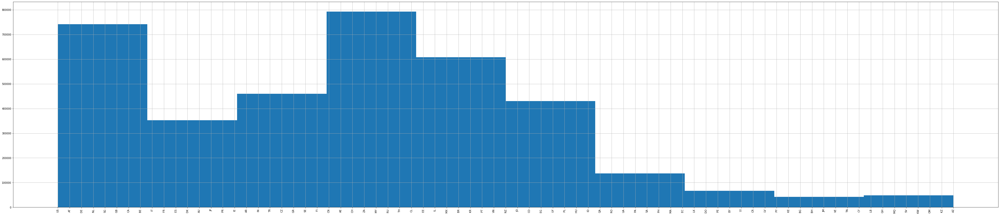

In [6]:
plt.figure(figsize=(70,15))
dataPOIs.Country.hist()
plt.xticks(rotation=90)
plt.show()

In [7]:
dataPOIs['Country'].value_counts()[:10].index.tolist()

['US', 'ID', 'TR', 'BR', 'MY', 'RU', 'JP', 'MX', 'TH', 'CL']

It's Obvious that the Cuntries that has the higher number of POIs are United States (US), Indonesia (ID) and Turkey (TR).

### Point of Interest Dataset - Analysis

In [8]:
col_names = ['uid', 'vid', 'datetime', 'Offset']
dataCheckins = pd.read_csv('dataset_original/Checkins.txt', sep='\t', header=None, names=col_names)
dataCheckins.head()

,uid,vid,datetime,Offset
0,50756,4f5e3a72e4b053fd6a4313f6,Tue Apr 03 18:00:06 +0000 2012,240
1,190571,4b4b87b5f964a5204a9f26e3,Tue Apr 03 18:00:07 +0000 2012,180
2,221021,4a85b1b3f964a520eefe1fe3,Tue Apr 03 18:00:08 +0000 2012,-240
3,66981,4b4606f2f964a520751426e3,Tue Apr 03 18:00:08 +0000 2012,-300
4,21010,4c2b4e8a9a559c74832f0de2,Tue Apr 03 18:00:09 +0000 2012,240


In [9]:
dataCheckins.shape

(33263631, 4)

In the above table we can see that che Checkins Dataset is composed by the following columns: `[UID, VID, UTC, Offset]` and have a total of `33.263.633` different Checkins, a Checkin is defined as a Time-Spatial point.
- `UID`: Integer identification code for a certain person.
- `VID`: String identification code for a certain Point of Interest.
- `UTC`: Description of the Datetime.
- `Offset`: Value used to complete the Datetime.

### User Profiles Dataset - Analysis

In [10]:
col_names = ['uid', 'Gender', 'TwitterFriends', 'TwitterFollowers']
dataUserProfileTKY = pd.read_csv('dataset_original/UserProfileTKY.txt', sep='\t', header=None, names=col_names)
dataUserProfileTKY.head()

,uid,Gender,TwitterFriends,TwitterFollowers
0,189941,male,730,513
1,24195,male,1073,1664
2,45082,male,1961,1272
3,179352,male,2750,2595
4,122942,male,149,975


In [11]:
dataUserProfileTKY.shape

(11874, 4)

In [12]:
col_names = ['uid', 'Gender', 'TwitterFriends', 'TwitterFollowers']
dataUserProfileNYC = pd.read_csv('dataset_original/UserProfileNYC.txt', sep='\t', header=None, names=col_names)
dataUserProfileNYC.head()

,uid,Gender,TwitterFriends,TwitterFollowers
0,15861,male,1039,69548
1,235138,male,453,720
2,143801,male,748,3780
3,128426,male,388,4307
4,134292,female,2800,48888


In [13]:
dataUserProfileNYC.shape

(18201, 4)

The two datasets are composed by the following columns: `[UID, Gender, TwitterFriends, TwitterFollowers]` and we have a total of `11.874` Users from Tokyo and `18.201` users from New York City.
- `UID`: Integer identification code for a certain person.
- `Gender`: String representing the gender, (male or female).
- `TwitterFriends`: Integer representing the number of Friends on Twitter.
- `TwitterFollowers`: Integer representing the number of Folowers on Twitter.

Let's start by seeing the distribution for both datasets regarding the gender:

In [14]:
dataUserProfileTKY.Gender.value_counts()

male      10187
female     1687
Name: Gender, dtype: int64

In [15]:
dataUserProfileNYC.Gender.value_counts()

male      11816
female     6385
Name: Gender, dtype: int64

In both datasets we have a majority of Male Users, but this majority it's higher in the Tokyo's one, here we have 6 times more data from Male Users instead of Female ones.

We can even find just out of curiosity information regaring Users based on the other two fields (TwitterFriends and TwitterFollowers):

### Datasets Preprocessing

We can start this section by merging the two most important datasets in our collection, `dataPOIs` and `dataCheckins`, that's because these two contains the spatial-time points of different Users, but then we would also need the geographical coordinates in oorder to correctly track their movement, therefore we have to merge these two in a unique dataset which we are goign to call `dataCheckinsPOIs`.

In [16]:
df1 = dataPOIs.set_index('vid')
df2 = dataCheckins.set_index('vid')
dataCheckinsPOIs = df1.join(df2)

In [17]:
dataCheckinsPOIs.to_csv(r'dataset_produced/CheckinsPOIs.csv', sep=',', mode='a', header=True, index=False)
dataCheckinsPOIs.head()

,lat,lng,Type,Country,uid,datetime,Offset
vid,,,,,,,
3fd66200f964a52000e71ee3,40.733596,-74.003139,Jazz Club,US,190844,Wed Apr 04 05:37:02 +0000 2012,-240
3fd66200f964a52000e71ee3,40.733596,-74.003139,Jazz Club,US,202010,Sat Apr 14 23:27:41 +0000 2012,-240
3fd66200f964a52000e71ee3,40.733596,-74.003139,Jazz Club,US,35452,Fri Apr 20 01:46:59 +0000 2012,-240
3fd66200f964a52000e71ee3,40.733596,-74.003139,Jazz Club,US,121415,Sat Apr 21 02:46:38 +0000 2012,-240
3fd66200f964a52000e71ee3,40.733596,-74.003139,Jazz Club,US,18353,Tue Apr 24 18:36:35 +0000 2012,-240


In [18]:
dataCheckinsPOIs.shape

(33263631, 7)

Here above we can see that the new dataset will contain the same number of rows as the `Checkins` dataset, but the number of columns for each row is now `7`, a combination of both datasets, since we have merged them using as `key` the `VID`.

This dataset should be fine to work on, but we can create just out of curiosity a Unique dataset that contains all datas from our collection, by merging the two `UserProfiles` dataset, the one from `Tokyo` and the one with informations about `New York City` Users, and then merge the one we just created (`dataUserProfiles`) with the one from the section before (`dataCheckinsPOIs`) and make some observations:

In [19]:
dataUserProfiles = dataUserProfileTKY.append(dataUserProfileNYC)
dataUserProfiles.to_csv(r'dataset_produced/UserProfiles.csv', sep=',', mode='a', header=True, index=False)
df1 = dataUserProfiles.set_index('uid')
df2 = dataCheckinsPOIs.set_index('uid')
dfUser_Checkins_POIs = df1.join(df2)
dfUser_Checkins_POIs.to_csv(r'dataset_produced/UsersCheckinsPOIs.csv', sep=',', mode='a', header=True, index=False)
dfUser_Checkins_POIs.head()

,Gender,TwitterFriends,TwitterFollowers,lat,lng,Type,Country,datetime,Offset
uid,,,,,,,,,
1,male,49,82,40.645089,-73.784523,Airport,US,Tue May 08 18:56:30 +0000 2012,-240
1,male,49,82,40.720643,-73.842518,Burger Joint,US,Mon Jul 02 17:49:07 +0000 2012,-240
1,male,49,82,40.645578,-73.776433,Airport Terminal,US,Mon May 07 17:18:46 +0000 2012,-240
1,male,49,82,40.645578,-73.776433,Airport Terminal,US,Tue May 08 18:56:54 +0000 2012,-240
1,male,49,82,40.630903,-73.739945,Grocery Store,US,Mon May 07 17:28:29 +0000 2012,-240


In [20]:
dfUser_Checkins_POIs.shape

(4415093, 9)

Here we can see that after we have merged everything in a unique dataset called `dataFrame` we have `9` columns that corresponds to all the informations we can have about one `POI` or `User` or `Checkin` but having said that, we have to notice the fact that we have a much smaller dataset `4.415.094`, therefore we have lost `28.848.539 Checkins`, that's because the `join` operation that we have used for merging if does not find a match on the selected index, in our case `UID` the rows are not considered and not merged. This can be explained by the fact that probably we have a `UID` for those `Checkins` but obviously those people are not present in the `dataUserProfiles` datasets from `TKY` or `NYC`.

### Dataset Preparation Next-location prediction

In this brief section we are going to build the dataset with all the essential information for us to start the main focus of our project, next-location prediction.

Our dataset will have the following features:
- `uid`: String identification code for a certain Person.
- `Datetime`: Date-time value describing when a the specific user was in that point of interest
- `Latitude`: Floating point number for the latitude of the Point of Interest.
- `Longitude`: Floating point number for the longitude of the point of Interest.
- `vid`: String identification code for a certain Point of Interest.

In [21]:
dataCheckinsPOIs = dataCheckinsPOIs.reset_index()
cols = list(dataCheckinsPOIs.columns.values)
cols

['vid', 'lat', 'lng', 'Type', 'Country', 'uid', 'datetime', 'Offset']

In [22]:
df = dataCheckinsPOIs[['uid', 'datetime', 'lat', 'lng', 'vid']]
df.head()

,uid,datetime,lat,lng,vid
0,190844,Wed Apr 04 05:37:02 +0000 2012,40.733596,-74.003139,3fd66200f964a52000e71ee3
1,202010,Sat Apr 14 23:27:41 +0000 2012,40.733596,-74.003139,3fd66200f964a52000e71ee3
2,35452,Fri Apr 20 01:46:59 +0000 2012,40.733596,-74.003139,3fd66200f964a52000e71ee3
3,121415,Sat Apr 21 02:46:38 +0000 2012,40.733596,-74.003139,3fd66200f964a52000e71ee3
4,18353,Tue Apr 24 18:36:35 +0000 2012,40.733596,-74.003139,3fd66200f964a52000e71ee3


To make all the process work we need in Pytorch for simplicity a specific timestamp for the `Datetime` feature: `yyyy-mm-dd hh:mm:ss`

In [23]:
df['datetime'] = pd.to_datetime(df['datetime'], format='%a %b %d %H:%M:%S %z %Y').dt.strftime('%Y-%m-%d %H:%M:%S')
df.head()

<ipython-input-23-6d15e0674f4e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['datetime'] = pd.to_datetime(df['datetime'], format='%a %b %d %H:%M:%S %z %Y').dt.strftime('%Y-%m-%d %H:%M:%S')


,uid,datetime,lat,lng,vid
0,190844,2012-04-04 05:37:02,40.733596,-74.003139,3fd66200f964a52000e71ee3
1,202010,2012-04-14 23:27:41,40.733596,-74.003139,3fd66200f964a52000e71ee3
2,35452,2012-04-20 01:46:59,40.733596,-74.003139,3fd66200f964a52000e71ee3
3,121415,2012-04-21 02:46:38,40.733596,-74.003139,3fd66200f964a52000e71ee3
4,18353,2012-04-24 18:36:35,40.733596,-74.003139,3fd66200f964a52000e71ee3


In [24]:
# poi_id = df['vid'].unique()
# mapping = {}
# for i in range(len(poi_id)):
#     mapping[poi_id[i]] = i
# print(list(mapping.items())[:5])
# df.replace({"vid": mapping})
# df

In [25]:
df.to_csv(r'dataset_produced/dataset.csv', sep=',', mode='a', header=True, index=False)

In [26]:
n_users, min_checkins = 50, 200
groups = df.groupby('uid')
sizes = groups.size()
users = sizes[sizes>=min_checkins].sample(n_users).index
df_50_200 = df[df['uid'].isin(users)].sort_values(['uid', 'datetime'], ascending = (True, False))

poi_id = df_50_200['vid'].unique()
mapping = {}
for i in range(len(poi_id)):
    mapping[poi_id[i]] = i
df_50_200 = df_50_200.replace({"vid": mapping})

uid_id = df_50_200['uid'].unique()
mapping = {}
for i in range(len(uid_id)):
    mapping[uid_id[i]] = i
df_50_200 = df_50_200.replace({"uid": mapping})
print(df_50_200)
df_50_200.to_csv(r'dataset_produced/dataset_50_200.csv', sep=',', mode='a', header=True, index=False)

          uid             datetime        lat         lng   vid
12369056    0  2013-09-16 20:20:32 -12.149431  -77.021327     0
7552624     0  2013-09-14 23:01:36 -12.061690  -77.033300     1
16123605    0  2013-09-12 05:42:07 -12.152682  -77.019718     2
5706443     0  2013-09-11 23:44:01 -12.125306  -77.032850     3
30934284    0  2013-09-04 18:08:11 -12.077858  -76.946397     4
...       ...                  ...        ...         ...   ...
6275221    49  2012-07-17 12:55:58  -6.890810  107.575872  5717
10370715   49  2012-07-17 10:00:31  -6.199617  106.798483  5718
3981744    49  2012-07-15 09:14:15  -6.224798  106.804243  5633
11278379   49  2012-07-14 12:16:30  -6.243883  106.674786  5706
11357230   49  2012-07-13 05:39:01  -6.181510  106.818470  5701

[16848 rows x 5 columns]


In [27]:
n_users, min_checkins = 100, 400
groups = df.groupby('uid')
sizes = groups.size()
users = sizes[sizes>=min_checkins].sample(n_users).index
df_100_400 = df[df['uid'].isin(users)].sort_values(['uid', 'datetime'], ascending = (True, False))
df_100_400.to_csv(r'dataset_produced/dataset_100_400.csv', sep=',', mode='a', header=True, index=False)

In [28]:
n_users, min_checkins = 200, 600
groups = df.groupby('uid')
sizes = groups.size()
users = sizes[sizes>=min_checkins].sample(n_users).index
df_200_600 = df[df['uid'].isin(users)].sort_values(['uid', 'datetime'], ascending = (True, False))
df_200_600.to_csv(r'dataset_produced/dataset_200_600.csv', sep=',', mode='a', header=True, index=False)

In [29]:
n_users, min_checkins = 1, 700
groups = df.groupby('uid')
sizes = groups.size()
users = sizes[sizes>=min_checkins].sample(n_users).index
df_1_700 = df[df['uid'].isin(users)].sort_values(['uid', 'datetime'], ascending = (True, False))

poi_id = df_1_700['vid'].unique()
mapping = {}
for i in range(len(poi_id)):
    mapping[poi_id[i]] = i
df_1_700 = df_1_700.replace({"vid": mapping})

uid_id = df_1_700['uid'].unique()
mapping = {}
for i in range(len(uid_id)):
    mapping[uid_id[i]] = i
df_1_700 = df_1_700.replace({"uid": mapping})
print(df_1_700)

df_1_700 = df_1_700.drop(columns=['lat', 'lng', 'uid'])
df_1_700.to_csv(r'dataset_produced/dataset_1_700.csv', sep=',', mode='a', header=True, index=False)

          uid             datetime        lat         lng  vid
3513953     0  2013-09-16 22:11:40  35.691009  139.924354    0
27666487    0  2013-09-16 15:26:09  35.692690  139.926241    1
3869622     0  2013-09-06 22:18:59  35.703260  139.941818    2
27666486    0  2013-08-31 11:19:22  35.692690  139.926241    1
27666485    0  2013-08-27 11:24:50  35.692690  139.926241    1
...       ...                  ...        ...         ...  ...
4946900     0  2012-04-04 14:42:56  35.675113  139.759612   18
12498224    0  2012-04-04 12:49:35  35.674107  139.760369   38
5597576     0  2012-04-04 11:57:18  35.673707  139.761226  178
5939742     0  2012-04-04 10:50:57  35.674167  139.760358  114
3513676     0  2012-04-03 21:53:57  35.691009  139.924354    0

[762 rows x 5 columns]


### Scikit-Mobility Analysis

In this section I am going to use the `Scikit-Mobility` on the `dataCheckinsPOIs` dataset in order to have a deeper understanding of the movements of different users.

In [30]:
print(type(dataCheckinsPOIs))

<class 'pandas.core.frame.DataFrame'>


In [31]:
dataCheckinsPOIs = dataCheckinsPOIs.reset_index()
dataCheckinsPOIs = dataCheckinsPOIs.drop('vid', 1)
dataCheckinsPOIs = dataCheckinsPOIs.drop('Type', 1)
dataCheckinsPOIs = dataCheckinsPOIs.drop('Country', 1)
dataCheckinsPOIs = dataCheckinsPOIs.drop('Offset', 1)
print(dataCheckinsPOIs.head())

   index        lat        lng     uid                        datetime
0      0  40.733596 -74.003139  190844  Wed Apr 04 05:37:02 +0000 2012
1      1  40.733596 -74.003139  202010  Sat Apr 14 23:27:41 +0000 2012
2      2  40.733596 -74.003139   35452  Fri Apr 20 01:46:59 +0000 2012
3      3  40.733596 -74.003139  121415  Sat Apr 21 02:46:38 +0000 2012
4      4  40.733596 -74.003139   18353  Tue Apr 24 18:36:35 +0000 2012


In [32]:
dataCheckinsPOIs['datetime'] = pd.to_datetime(dataCheckinsPOIs['datetime'], format='%a %b %d %H:%M:%S %z %Y')

In [33]:
print(type(dataCheckinsPOIs))

<class 'pandas.core.frame.DataFrame'>


In [34]:
tdf = skmob.TrajDataFrame(dataCheckinsPOIs, latitude='lat', longitude='lng', datetime='datetime', user_id='uid')
print(type(tdf))

<class 'skmob.core.trajectorydataframe.TrajDataFrame'>


In [35]:
print(tdf)

             index        lat         lng     uid                  datetime
0                0  40.733596  -74.003139  190844 2012-04-04 05:37:02+00:00
1                1  40.733596  -74.003139  202010 2012-04-14 23:27:41+00:00
2                2  40.733596  -74.003139   35452 2012-04-20 01:46:59+00:00
3                3  40.733596  -74.003139  121415 2012-04-21 02:46:38+00:00
4                4  40.733596  -74.003139   18353 2012-04-24 18:36:35+00:00
...            ...        ...         ...     ...                       ...
33263626  33263626  40.154444   26.410847  124661 2013-09-16 22:29:51+00:00
33263627  33263627  35.340099   33.309328  230432 2013-09-16 22:30:31+00:00
33263628  33263628  -1.404065  -48.453742  144518 2013-09-16 22:35:42+00:00
33263629  33263629   3.425155  -76.545010   45417 2013-09-16 22:54:34+00:00
33263630  33263630  -6.129426  106.650974   64324 2013-09-16 23:20:48+00:00

[33263631 rows x 5 columns]


In [36]:
tdf.plot_trajectory(zoom=12, weight=3, opacity=0.9, tiles='Stamen Toner', max_users=100, max_points=None)

/home/student2/miniconda3/envs/pytorch_env/lib/python3.8/site-packages/skmob/utils/plot.py:133: UserWarning: Only the trajectories of the first 10 users will be plotted. Use the argument `max_users` to specify the desired number of users, or filter the TrajDataFrame.
  warnings.warn("Only the trajectories of the first 10 users will be plotted. Use the argument `max_users` to specify the desired number of users, or filter the TrajDataFrame.")


In [37]:
h1_df = home_location(tdf)

100%|██████████| 266909/266909 [09:20<00:00, 476.62it/s]


In [38]:
print(h1_df)

           uid        lat         lng
0            1  40.694334  -73.678330
1            2  35.319030  139.550700
2            3  35.510872  139.567094
3            4  35.700283  139.985597
4            5  34.701410  135.494860
...        ...        ...         ...
266904  266905 -19.932550  -44.031197
266905  266906  -3.811995  -38.591296
266906  266907  41.212262   29.037205
266907  266908  51.496002   -0.325064
266908  266909 -23.570587  -46.640123

[266909 rows x 3 columns]


In [39]:
map = folium.Map(tiles='openstreetmap', zoom_start=12, control_scale=True)
HeatMap(h1_df[['lat', 'lng']].values).add_to(map)
map